In [1]:
from IPython.display import display, HTML#, clear_output, Image, Audio

import sys
import os

import pandas as pd
import numpy as np
from datetime import datetime, timedelta, date
import calendar 

# matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['font.sans-serif'] = "Cambria"
plt.rcParams['font.family'] = "sans-serif"
plt.rcParams['mathtext.fontset'] = "stix"
plt.rcParams['figure.facecolor'] = 'white'

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 200

# machine learning
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

# fitting
import scipy.optimize

# demand fingerprint module
sys.path.insert(0, "../../demandfingerprint/")
sys.path.insert(0, "../../")
import syn
import pdhelper

sys.path.insert(0, "./modules/")
import plthelper
import plots

#dir management
data_dir = './data/'

### Load Data

In [2]:
# load temperature data
# uses the monthly demand weighted temperature
kyushu_mean_temp_src = pd.read_csv(data_dir+'kyushu_temp_demand_weighted.csv', index_col='datetime')
kyushu_mean_temp_src.index = pd.to_datetime(kyushu_mean_temp_src.index)
kyushu_mean_temp = kyushu_mean_temp_src['2016-04':'2020-03']

# load demand data
# extracted from the hourly data reported by KyEPCO
kyushu_demand = pd.read_csv(data_dir+'kyushu_hourly_demand_data.csv', index_col = 'datetime')
kyushu_demand.index = pd.to_datetime(kyushu_demand.index)

### Extract weekly Data

In [3]:
# get the weekly data
weekly_df = syn.get_weekly(kyushu_demand['Demand'], addweeks = 1)

### Preprocessing - Alignment

In [4]:
# align to demand fingerprint
#weekly_df_aligned = syn.align_to_fingerprint(weekly_df)
weekly_df_aligned = weekly_df.apply(syn.align_to_fingerprint_wk, axis=1)

### Preprocessing - Scaling

In [5]:
# scale demand magnitude
weekly_df_scaled = weekly_df_aligned.T
weekly_df_scaled = weekly_df_scaled.apply(syn.z_score_standardization)
weekly_df_scaled = pdhelper.datetime_transform(weekly_df_scaled)

### FFT Transform

In [6]:
# fft transform
weekly_fft = dict()
for i, dfx in weekly_df_scaled.iterrows():
    weekly_fft[i] = syn.fft_magnitude(dfx.to_list())
weekly_fft = pd.DataFrame(weekly_fft).T

# select FFT frequencies; only the daily variations
harmonics = list(range(7,84,7)) 
weekly_fft_z = weekly_fft[harmonics].apply(syn.z_score_standardization)

# scale FFT magnitude
weekly_df_z = weekly_df.T
weekly_df_z = weekly_df_z.apply(syn.z_score_standardization)
weekly_df_z = pdhelper.datetime_transform(weekly_df_z)

### Clustering

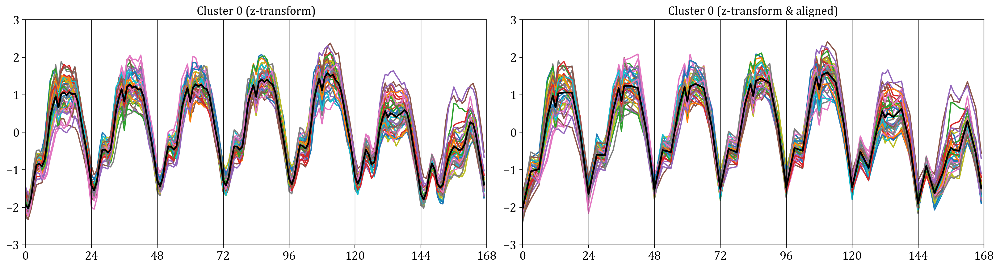

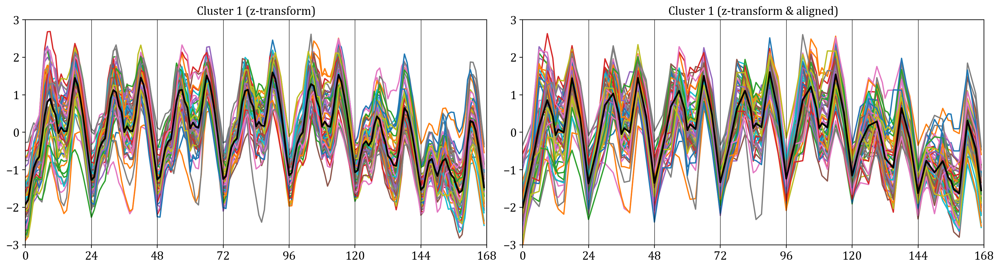

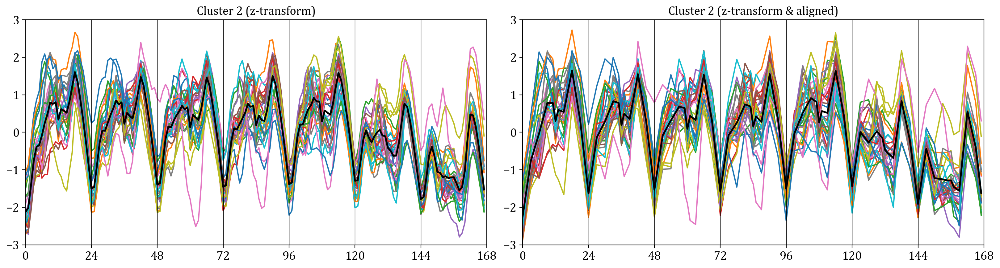

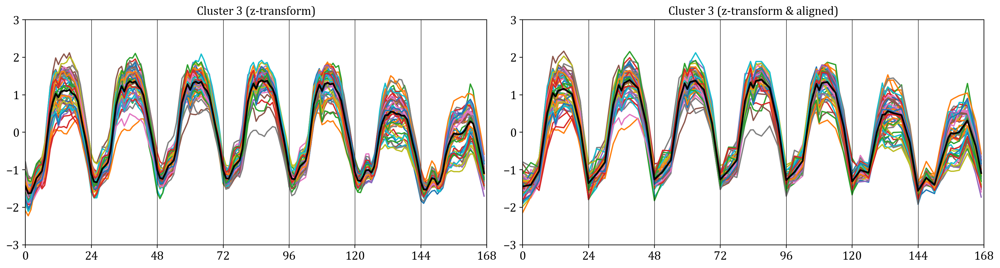

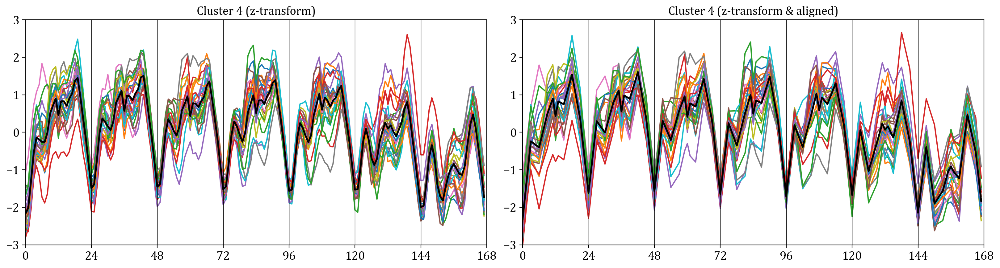

In [7]:
k_assigned = 5
kmeans = KMeans(n_clusters=k_assigned, random_state=100).fit(weekly_fft_z)
kmean_label_df = syn.kmean_label_df(kmeans, weekly_fft_z)

reorder_k = dict(zip(list(range(5)),[2,4,1,0,3]))

weekly_clustered = dict()
for i in range(0,k_assigned):
    filterx = kmean_label_df[kmean_label_df.label == i].index.to_list()
    filtered_df = weekly_df_scaled[weekly_df_scaled.index.isin(filterx)]

    filtered_df2 = weekly_df_z[weekly_df_z.index.isin(filterx)]
    
    weekly_clustered[i] = weekly_df[weekly_df.index.isin(filterx)]
      
    if True:
        plthelper.plt_set_size(14)
        fig, axs = plt.subplots(1,2)
        fig.set_size_inches(16,4)
        plt.tight_layout(pad=0, w_pad=.5, h_pad=.5)

        ax = axs[0]
        filtered_df2.T.plot(ax=ax)
        ax.legend().remove()
        filtered_df2.mean().plot(ax=ax, linewidth=2, c='k') 
        ax.set_title(f'Cluster {i} (z-transform)')
        
        ax = axs[1]
        filtered_df.T.plot(ax=ax) 
        ax.legend().remove()
        filtered_df.mean().plot(ax=ax, linewidth=2, c='k') 
        ax.set_title(f'Cluster {i} (z-transform & aligned)')

        for ax in axs:
            xticks = list(range(0,169,24))
            ax.set_xticks(xticks)
            ax.set_ylim(-3,3)
            ax.set_xlim(0,168)

            for x in range(24, 168, 24):
                ax.axvline(x=x, color='k', linewidth =0.5)

### Extract the Fourier Components

In [8]:
cluster_fingerprint = dict()

for i in range(5):
    cluster_df = weekly_clustered[i]
    cluster_df.columns = list(range(0,168))
    
    freq_mag, freq_phase = syn.extract_fingerprint(cluster_df)

    a, b, n = 0, 100, 168
        
    x_vals = np.arange(0,n)
    y_vals = syn.reconstruct_fingerprint(x_vals, a, b, freq_mag, freq_phase)
    minval = pd.Series(y_vals[:24]).idxmin()
    maxval = pd.Series(y_vals[:24]).idxmax()   
    
    cluster_fingerprint[i] = (freq_mag, freq_phase, minval, maxval)

In [9]:
# sample for the visualization
cluster_sample = []
for i in range(5):
    cluster_df = weekly_clustered[i]
    
    #get sample
    cluster_data = cluster_df.iloc[20].to_list()
    
    #known values
    values_xknown = list(range(168))
    minval, maxval, sat_min, sat_max, sun_min, sun_max = syn.get_week_minmax(cluster_data)
    values_yknown0 = [minval, maxval]*5 + [sat_min, sat_max, sun_min, sun_max]
    
    #fit
    fit_y = syn.reconstruct_week(i, values_yknown0, cluster_fingerprint)
    
    #sample
    cluster_sample.append(fit_y[:25])

# plot
if False:
    plthelper.plt_set_size(14)
    fig, axs = plt.subplots(1,5)
    fig.set_size_inches(16,3)
    plt.tight_layout(pad=0, w_pad=.5, h_pad=.5)

    lcolor = ["darkviolet","blue","forestgreen", "darkorange", "crimson"]
    reorder = dict(zip(list(range(5)), [1, 2, 4, 0, 3])) 

    for i, ax in enumerate(axs):
        ax.plot(range(25), cluster_sample[reorder[i]], color=lcolor[i])
        ax.set_xlim(0,24)
        for x in range(3,24,3):
            ax.axvline(x=x, color='grey', linewidth = '0.5')
        ax.axvline(x=12, color='k', linewidth = '0.5')
        ax.set(title=f'cluster {i}')
        ax.get_yaxis().set_visible(False)
        ax.get_xaxis().set_visible(False)

### Classification

In [10]:
# extract weekly statistics
weekly_df_temperature = syn.get_weekly(kyushu_mean_temp['kyushu'])

weekly_df_stat_temp = syn.get_kyushu_weekly_minmax(kyushu_mean_temp)

weekly_df_stat_temp['9AM_max'] = syn.get_weekday_hourly_apply(weekly_df_temperature, np.max, 9)
weekly_df_stat_temp['6AM_min'] = syn.get_weekday_hourly_apply(weekly_df_temperature, np.min, 6)
weekly_df_stat_temp['3PM_min'] = syn.get_weekday_hourly_apply(weekly_df_temperature, np.min, 15)

weekly_df_temp_clustering = [weekly_df_stat_temp['2016-04':'2020-03'].copy(), kmean_label_df]
weekly_df_temp_clustering = pd.concat(weekly_df_temp_clustering, axis=1)
weekly_df_temp_clustering['month'] = weekly_df_temp_clustering.index.month
weekly_df_temp_clustering.head(3)

,mintemp,maxtemp,9AM_max,6AM_min,3PM_min,label,month
2016-04-04,13.795271,20.116386,22.9072,12.5273,17.8345,4,4
2016-04-11,13.525586,21.236300,20.4102,10.9833,17.9479,4,4
2016-04-18,13.137314,20.040243,19.9990,11.1645,16.0492,4,4


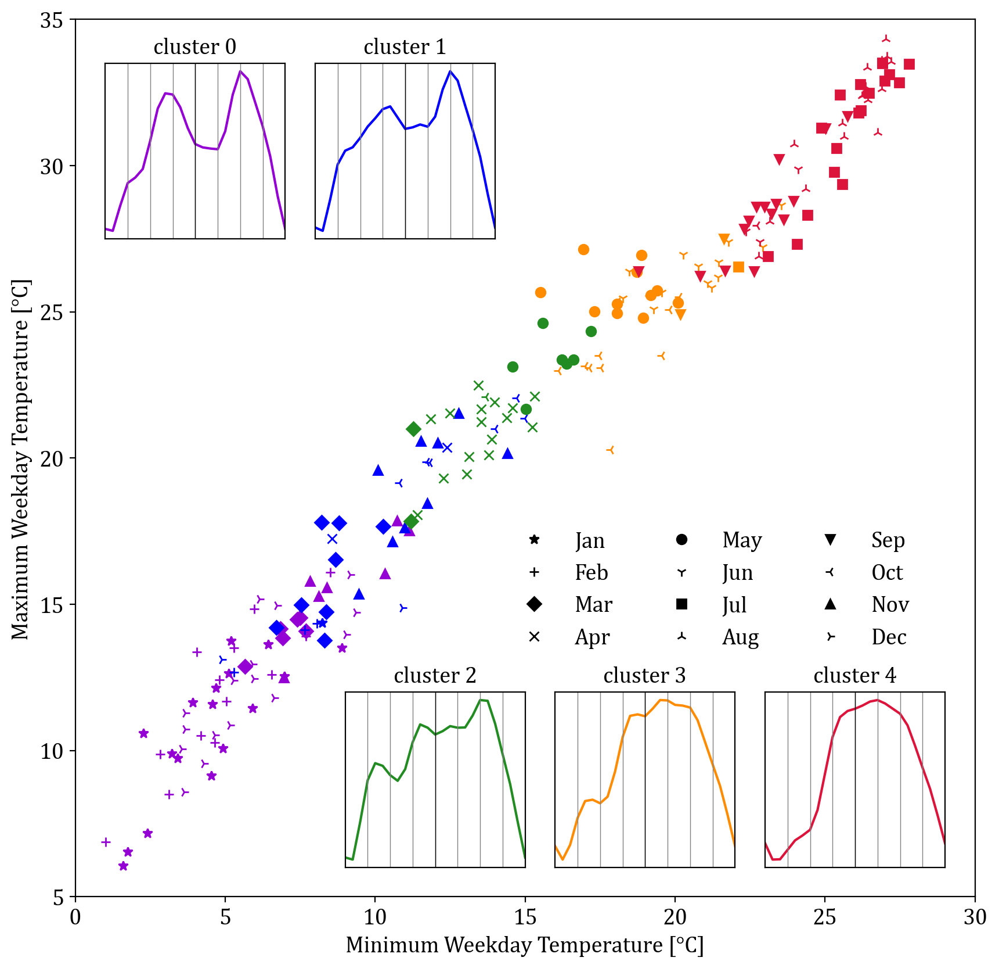

In [11]:
reorder = dict(zip(list(range(5)), [1, 2, 4, 0, 3])) 
markers = ['*', '+', 'D', 'x', 'o', '1', 's', '2', 'v', '3', '^', '4']
lcolor = ["darkviolet","blue","forestgreen", "darkorange", "crimson"]

plthelper.plt_set_size(14)
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
linestyles = markers

for j in range(5):
    i = reorder[j]
    dfx = weekly_df_temp_clustering[weekly_df_temp_clustering.label == i]
    
    for i, row in dfx.iterrows():  
        marker = linestyles[int(row.month)-1]
        ax.plot(row.mintemp, row.maxtemp, linewidth=0, marker=marker, color=lcolor[j])

ax_inset = dict()
offset1 = 1
inset_x = [1, 8, 8+offset1, 15+offset1, 22+offset1]
inset_y = [27.5, 27.5, 6, 6, 6]
for i in range(len(inset_x)):
    ax_inset[i] = ax.inset_axes([inset_x[i], inset_y[i], 6, 6], transform=ax.transData)
    ax_inset[i].plot(range(25), cluster_sample[reorder[i]], color=lcolor[i])
    ax_inset[i].get_yaxis().set_visible(False)
    ax_inset[i].get_xaxis().set_visible(False)
    ax_inset[i].set_xlim(0,24)
    for x in range(3,24,3):
        ax_inset[i].axvline(x=x, color='grey', linewidth = '0.5')
    ax_inset[i].axvline(x=12, color='k', linewidth = '0.5')
    ax_inset[i].set(title=f'cluster {i}')
    
    
ax.set_ylim(5,35)    
ax.set_xlim(0,30);
ax.set(ylabel = 'Maximum Weekday Temperature [°C]', xlabel = 'Minimum Weekday Temperature [°C]');
ax.legend(handles=plots.legend_elements_clustering(), loc = 'center right', ncol = 3, frameon =False, bbox_to_anchor=[.95, .35]);

### Classfication

In [12]:
if False:
    test_score = []
    for r in range(1000):
        # Split the data into train and test sets

        data_col = ['mintemp', 'maxtemp', '6AM_min','9AM_max',  '3PM_min', 'month']
        data = weekly_df_temp_clustering[data_col]
        target = weekly_df_temp_clustering['label']

        X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.2)


        #Create KNN Classifier
        knn = KNeighborsClassifier(n_neighbors=5)

        #Train the model using the training sets
        knn.fit(X_train, y_train)

        #Predict the response for test dataset
        y_pred = knn.predict(X_test)

        # Model Accuracy, how often is the classifier correct?
        acc = metrics.accuracy_score(y_test, y_pred)
        #print(f'Accuracy: {round(acc,4)}%' )
        test_score.append(acc)

    print('mean', np.mean(test_score))
    print('max', np.max(test_score))
    print('min', np.min(test_score))

In [13]:
# Split the data into train and test sets

data_col = ['mintemp', 'maxtemp', '6AM_min','9AM_max',  '3PM_min', 'month']
data = weekly_df_temp_clustering[data_col]
target = weekly_df_temp_clustering['label']

X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.2)


#Create KNN Classifier
knn = KNeighborsClassifier(n_neighbors=5)

#Train the model using the training sets
knn.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = knn.predict(X_test)

# Model Accuracy, how often is the classifier correct?
acc = metrics.accuracy_score(y_test, y_pred)
print(f'Accuracy: {round(acc*100,2)}%' )


Accuracy: 85.71%


### Weekend Ratio

### Correlate Demand and Temperature

In [14]:
# identify holidays and weekends
holidays = syn.get_jp_holidays(data_dir, 2016,2020)

#Extract non-holiday weekeday temperature demand
kyushu_nonholiweekday_stat = syn.get_kyushu_nonholiweekday_stat(kyushu_demand, kyushu_mean_temp, holidays)

In [15]:
# calculate weekly power statistics
weekly_demand_stat = syn.calculate_weekly_demand_statistics(weekly_df)

# calculate weekend ratio
week_end_ratio = syn.calculate_weekend_ratio(weekly_demand_stat)

In [16]:
dfx = kyushu_nonholiweekday_stat

xdata, ydata = dfx['maxtemp'].to_list(), dfx['maxdemand'].to_list()

fit_func0 = syn.piecewise_linear3

xdata, ydata =np.array(xdata), np.array(ydata)
sigma = np.ones(len(ydata))
bounds=(( 15, 20, 8000, 8000,-np.inf, -np.inf, -np.inf), (22, 30, 12000, 12000,np.inf, np.inf, np.inf))
p0 = [ 20, 22.5, 9000, 9000,1, 1, 1]

parameter_optimal_maxtemp, _ = scipy.optimize.curve_fit(fit_func0, xdata, ydata, p0 = p0, bounds=bounds)

#define the max demand function
def maxdemand_func(x):
    return fit_func0(x, *parameter_optimal_maxtemp)

r_squared = metrics.r2_score(ydata, maxdemand_func(xdata))
print('R^2 =', round(r_squared,4))

# plot
if False:
    plthelper.plt_set_size(14)
    fig, ax= plt.subplots(1,1)
    fig.set_size_inches(7,5)

    # raw data
    dfx.plot(ax=ax, x='maxtemp', y='maxdemand', style='.')

    #fitted data
    x_range = np.arange(0, 40, 0.1)
    fitted_max = maxdemand_func(x_range)
    ax.plot(x_range, fitted_max, color= 'k')
    ax.set_xlim(0,40);
    ax.set(xlabel='Maximum Temperature (°C)', ylabel = 'Electricity Demand (MW)')
    ax.legend().remove()


R^2 = 0.8817


In [17]:
dfx = kyushu_nonholiweekday_stat

xdata, ydata = dfx['mintemp'].to_list(), dfx['mindemand'].to_list()

fit_func = syn.quadratic

xdata, ydata =np.array(xdata), np.array(ydata)
sigma = np.ones(len(ydata))
parameter_optimal_mintemp, _ = scipy.optimize.curve_fit(fit_func, xdata, ydata, p0 = [1, 0, 1])

#define the min demand function
def mindemand_func(x):
    return fit_func(x, *parameter_optimal_mintemp)

r_squared = metrics.r2_score(ydata, mindemand_func(xdata))
print('R^2 =', round(r_squared,4))

# plot
if False:
    plthelper.plt_set_size(14)
    fig, ax= plt.subplots(1,1)
    fig.set_size_inches(7,5)
    
    #raw data
    dfx.plot(ax=ax, x='mintemp', y='mindemand', style='.')
    
    #fitted data
    x_range = np.arange(-5, 40, 0.5)
    fitted_f = mindemand_func(x_range)
 
    ax.plot(x_range, fitted_f, color ='k')
    ax.set_xlim(-5,35);
    ax.set(xlabel='Minimum Temperature (°C)', ylabel = 'Electricity Demand (MW)')
    ax.legend().remove()

R^2 = 0.7989


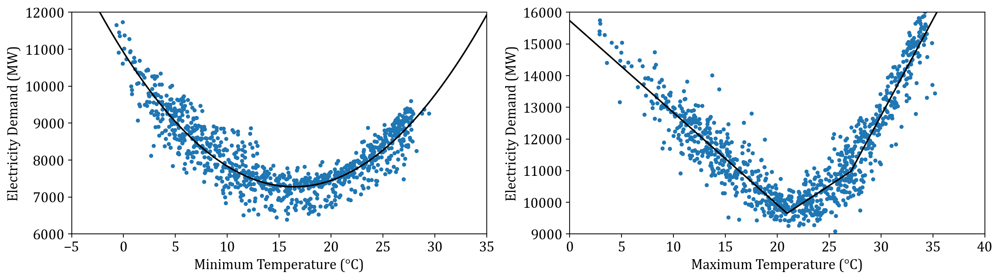

In [18]:
# for paper
plthelper.plt_set_size(14)
fig, axs= plt.subplots(1,2)
fig.set_size_inches(16,4)

x_range = np.arange(-10, 40, 0.1)

ax = axs[0]
kyushu_nonholiweekday_stat.plot(ax=ax, x='mintemp', y='mindemand', style='.', legend=False)
ax.set(xlabel='Minimum Temperature (°C)', ylabel = 'Electricity Demand (MW)')
ax.set_ylim(6000, 12000)
fitted_min = mindemand_func(x_range)
ax.plot(x_range, fitted_min, color='k')
ax.set_xlim(-5,35)

ax = axs[1]
kyushu_nonholiweekday_stat.plot(ax=ax, x='maxtemp', y='maxdemand', style='.', legend=False)
fitted_max = maxdemand_func(x_range)
ax.plot(x_range, fitted_max, color='k')
ax.set(xlabel='Maximum Temperature (°C)', ylabel = 'Electricity Demand (MW)');
ax.set_ylim(9000, 16000)
ax.set_xlim(0,40);

### Testing the Accuraccy of the Demand Generation

In [19]:
#compared with the existing data
for year in [2017, 2018, 2019]:
    syn_temp = syn.generate_temp_ref(int(year), kyushu_mean_temp)
    syn_demand = syn.generate_demand(syn_temp, knn, mindemand_func, maxdemand_func, week_end_ratio, cluster_fingerprint)
    r2 = pdhelper.r_square(kyushu_demand[str(year)]['Demand'].to_list(), syn_demand[str(year)]['Demand'].to_list())
    print(year, 'R^2=', round(r2,4))

2017 R^2= 0.867
2018 R^2= 0.8716
2019 R^2= 0.8177


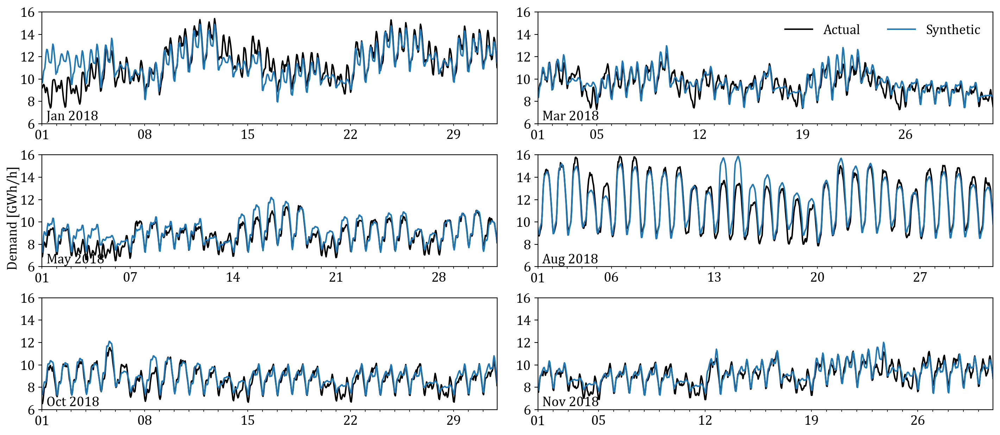

In [20]:
# sample visualization for the paper
fig, axs = plt.subplots(3,2)
fig.set_size_inches(14,6)
axs = [item for sublist in axs for item in sublist]
plt.tight_layout(pad=0, w_pad=.5, h_pad=.5)

yticks = list(range(6000,16001,2000))

year = 2018
months = [1, 3, 5, 8, 10, 11]
syn_temp = syn.generate_temp_ref(int(year), kyushu_mean_temp)
syn_demand = syn.generate_demand(syn_temp, knn, mindemand_func, maxdemand_func, week_end_ratio, cluster_fingerprint)
for i, m in enumerate(months):
    
    datex = f'{year}-{m}'
    kyushu_demand[datex]['Demand'].plot(ax=axs[i], color='k', label ='Actual')
    syn_demand[datex]['Demand'].plot(ax=axs[i], label = 'Synthetic')

    axs[i].set_ylim(6000,16000)
    axs[i].set(xlabel='')
    axs[i].legend(ncol=2);
    axs[i].set_yticks(yticks)
    axs[i].set_yticklabels([int(y/1000) for y in yticks])
    axs[i].legend().remove()
   
axs[1].legend(ncol=2, edgecolor = 'white');
for ax, m in zip(axs, months):
    pos = ax.get_xticklabels()[0].get_position()
    ax.text(pos[0], -.14, s='01', transform=ax.transAxes, ha='center')
    ax.text(.01, .03, s=f'{calendar.month_abbr[m]} {year}', transform=ax.transAxes, ha='left', size=14)
    ax.get_xaxis().set_ticks([])
    
fig.text(-0.01, 0.5, 'Demand [GWh/h]', rotation=90, size = 14, va='center');

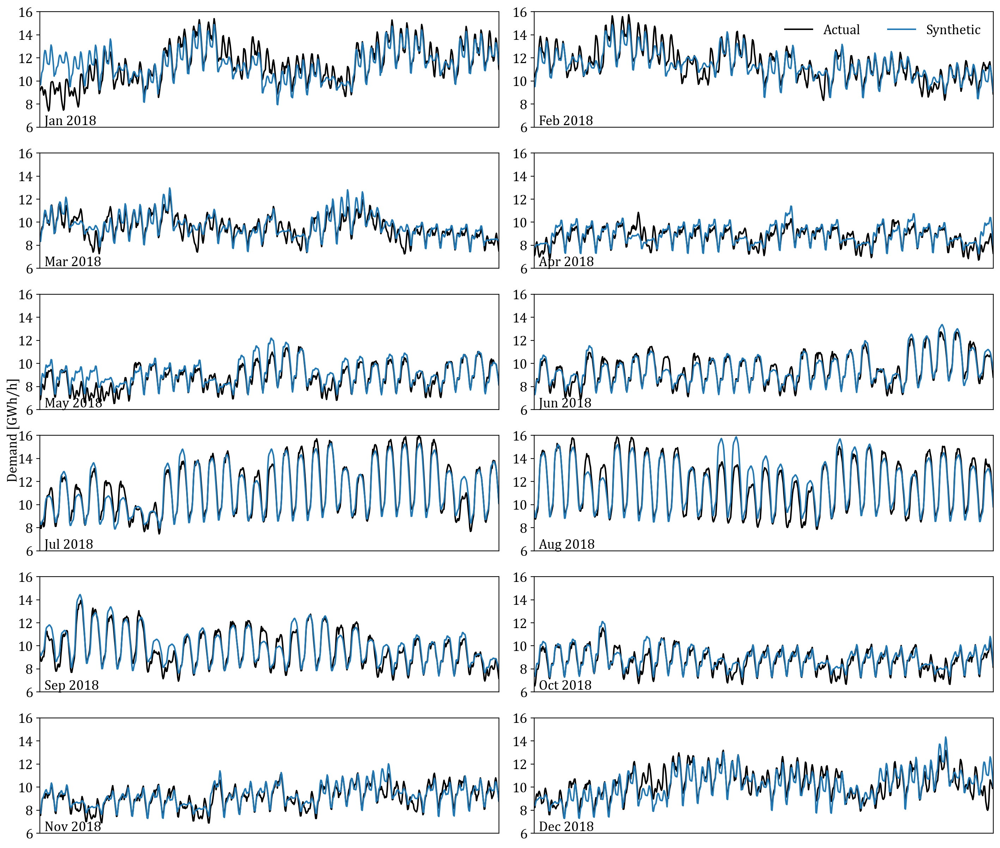

In [21]:
# full year visualization
fig, axs = plt.subplots(6,2)
fig.set_size_inches(14,12)
axs = [item for sublist in axs for item in sublist]
plt.tight_layout(pad=0, w_pad=.1, h_pad=.1)

yticks = list(range(6000,16001,2000))

year = 2018
months = [1, 3, 5, 8, 10, 11]
syn_temp = syn.generate_temp_ref(int(year), kyushu_mean_temp)
syn_demand = syn.generate_demand(syn_temp, knn, mindemand_func, maxdemand_func, week_end_ratio, cluster_fingerprint)
for i, m in enumerate(range(1,13)):
    
    datex = f'{year}-{m}'
    kyushu_demand[datex]['Demand'].plot(ax=axs[i], color='k', label ='Actual')
    syn_demand[datex]['Demand'].plot(ax=axs[i], label = 'Synthetic')

    axs[i].set_ylim(6000,16000)
    axs[i].set(xlabel='')
    axs[i].legend(ncol=2);
    axs[i].set_yticks(yticks)
    axs[i].set_yticklabels([int(y/1000) for y in yticks])
    axs[i].legend().remove()
    #axs[i].set_ylabel('Demand [GWh/h]')
   
axs[1].legend(ncol=2, edgecolor = 'white', loc= 'upper right', framealpha=0);
for ax, m in zip(axs, range(1,13)):
    pos = ax.get_xticklabels()[0].get_position()
    #ax.text(pos[0], -.09, s='01', transform=ax.transAxes, ha='center')
    ax.text(.01, .02, s=f'{calendar.month_abbr[m]} {year}', transform=ax.transAxes, ha='left', size=14)
    ax.get_xaxis().set_ticks([])
    ax.get_xaxis().set_ticks([], minor=True)
    
fig.text(-0.008, 0.5, 'Demand [GWh/h]', rotation=90, size = 14, va='center');

### Generate synthetic demands using demand fingerprint

In [22]:
# with reference year -- same year but different weather conditions
# 2018 was chosen because this is the start of the curtailment
ref_year_index = syn.generate_temp_ref(int(2018), kyushu_mean_temp).index
n_hours = len(ref_year_index)

kyushu_temp = kyushu_mean_temp_src
years = [2014,1991,2016,2018,2013,2012]
syn_demand_dict = dict()
for year in years:
    syn_temp = syn.generate_temp_ref(int(year), kyushu_temp)['kyushu'].to_list()[:n_hours]
    syn_temp = pd.DataFrame(syn_temp, index = ref_year_index, columns = ['kyushu'])
    syn_demand = syn.generate_demand(syn_temp, knn, mindemand_func, maxdemand_func, week_end_ratio, cluster_fingerprint)
    syn_demand_dict[year] = syn_demand
    
syn_demand = pdhelper.dfdictExtractColumn(syn_demand_dict, 'Demand')

In [23]:
# save the synthetic demand into the pypsa folder
if False:
    syn_demand = pdhelper.dfdictExtractColumn(syn_demand_dict, 'Demand')
    syn_demand = syn_demand.astype('int32')
    save_dir = r'pypsa/csv_folder' + os.sep
    syn_demand.to_csv(save_dir+'syn_demand.csv')

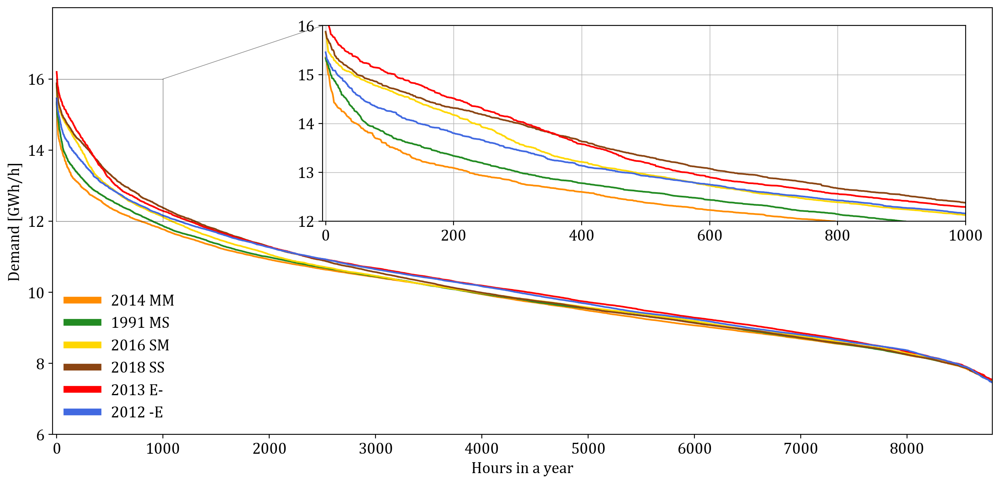

In [24]:
plthelper.plt_set_size(14)
fig, ax= plt.subplots(1,1)
fig.set_size_inches(15,7)

lcolor = ["darkorange", "forestgreen","gold", "saddlebrown", "red", "royalblue"]
inset_bounds = [2500, 12000, 6050, 5500]
ax_inset = ax.inset_axes(inset_bounds, transform=ax.transData)

years_sample = [2014, 1991, 2016, 2018, 2013, 2012]
for year, c in zip(years_sample, lcolor):
    demand = syn_demand[year].to_list()
    demand.sort(reverse=True)
    x = range(len(demand))
    ax.plot(x, demand, label = year, c=c)
    ax_inset.plot(x, demand, c=c)
    
ax.set_ylim(6000, 18000)    
ax.set_xlim(-40,8800)

ax_inset.set_ylim(12000, 16000)
ax_inset.set_xlim(-5,1000)
    
plthelper.ticks_adjust(ax, 'y', list(range(6000, 16001, 2000)), 1000)
plthelper.ticks_adjust(ax_inset, 'y', list(range(12000, 16001, 1000)), 1000)

plthelper.mark_inset_zoom(ax, ax_inset, inset_bounds, color='k', alpha=0.5, linewidth =0.5)

ax_inset.grid(lw=0.5)
ax.set_axisbelow(True)

ax.legend(handles = plots.legend_elements_year_rep(), loc='lower left', edgecolor='white')
ax.set(ylabel ='Demand [GWh/h]', xlabel ='Hours in a year');